#Finding co relatation pune weather and pune covid cases

## Download the data 

In [ ]:
import requests

def download_from_google_drive(id, destination):

      def get_confirm_token(response):
          for key, value in response.cookies.items():
              if key.startswith('download_warning'):
                  return value

          return None


      URL = "https://docs.google.com/uc?export=download"


      def save_response_content(response, destination):
          CHUNK_SIZE = 32768

          with open(destination, "wb") as f:
              for chunk in response.iter_content(CHUNK_SIZE):
                  if chunk: # filter out keep-alive new chunks
                      f.write(chunk)

      session = requests.Session()

      response = session.get(URL, params = { 'id' : id }, stream = True)
      token = get_confirm_token(response)

      if token:
          params = { 'id' : id, 'confirm' : token }
          response = session.get(URL, params = params, stream = True)

      save_response_content(response, destination)


In [ ]:
import pandas as pd


drive_id = '1ErfwdAdG7vA4IApDyocK3fhI8XdrR7-7'

name = 'processed_data.csv'

download_from_google_drive(drive_id,name)

In [ ]:
df = pd.read_csv(name).drop(['Unnamed: 0'],axis = 1)
df.head()

,Date,dailysamples,dailyconfirmed,dailyrecovered,dailydeceased,totalcritical,totalsamples,totalconfirmed,totalhospital,totalrecovered,totaldeceased,active_hosp,active_home,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,SLP in hPa,Tmax,Tmin,Rain_in_mm,Rh_in_%,Wind_Direction,Wind_Speed(kmph)
0,15.3.2021,7266,1082,678,10,370.0,1255652,219285,11984.0,202339,4962.0,5112.0,6872.0,-32.0,-2.0,-37.0,-11.0,-34.0,14.0,946.0,37.0,16.0,0.0,20.0,274.0,3.0
1,16.3.2021,8044,1925,677,7,394.0,1263696,221210,13225.0,203016,4969.0,3328.0,9897.0,-34.0,-3.0,-38.0,-12.0,-35.0,15.0,946.0,37.0,16.0,1307.0,15.0,88.0,1.0
2,17.3.2021,11230,2587,769,11,425.0,1274926,223797,15032.0,203785,4980.0,3928.0,11104.0,-34.0,0.0,-39.0,-10.0,-32.0,15.0,945.0,37.0,17.0,2768.0,17.0,107.0,2.0
3,18.3.2021,11835,2752,885,22,440.0,1286761,226549,16877.0,204670,5002.0,4789.0,12088.0,-34.0,0.0,-40.0,-12.0,-34.0,16.0,945.0,37.0,18.0,45.0,21.0,289.0,4.0
4,19.3.2021,12625,2834,499,15,499.0,1299386,229383,18888.0,205478,5017.0,3705.0,15183.0,-34.0,3.0,-40.0,-12.0,-32.0,16.0,945.0,36.0,20.0,6330.0,19.0,281.0,4.0


In [ ]:
df.columns

Index(['Date', 'dailysamples', 'dailyconfirmed', 'dailyrecovered',
       'dailydeceased', 'totalcritical', 'totalsamples', 'totalconfirmed',
       'totalhospital', 'totalrecovered', 'totaldeceased', 'active_hosp',
       'active_home', 'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline', '   SLP in hPa', 'Tmax',
       'Tmin', 'Rain_in_mm', 'Rh_in_%', 'Wind_Direction', 'Wind_Speed(kmph)'],
      dtype='object')

In [ ]:
df['SLP in hPa'] = df['\xa0\xa0\xa0SLP in hPa']

## consider only cessis and IMD columns 

In [ ]:
Date = list(df['Date'])

In [ ]:
df = df[['dailysamples', 'dailyconfirmed', 'dailyrecovered',
       'dailydeceased', 'totalcritical', 'totalsamples', 'totalconfirmed',
       'totalhospital', 'totalrecovered', 'totaldeceased', 'active_hosp',
        'SLP in hPa','Tmax',
       'Tmin', 'Rain_in_mm', 'Rh_in_%', 'Wind_Direction', 'Wind_Speed(kmph)']]

In [ ]:
df

,dailysamples,dailyconfirmed,dailyrecovered,dailydeceased,totalcritical,totalsamples,totalconfirmed,totalhospital,totalrecovered,totaldeceased,active_hosp,SLP in hPa,Tmax,Tmin,Rain_in_mm,Rh_in_%,Wind_Direction,Wind_Speed(kmph)
0,7266,1082,678,10,370.0,1255652,219285,11984.0,202339,4962.0,5112.0,946.0,37.0,16.0,0.0,20.0,274.0,3.0
1,8044,1925,677,7,394.0,1263696,221210,13225.0,203016,4969.0,3328.0,946.0,37.0,16.0,1307.0,15.0,88.0,1.0
2,11230,2587,769,11,425.0,1274926,223797,15032.0,203785,4980.0,3928.0,945.0,37.0,17.0,2768.0,17.0,107.0,2.0
3,11835,2752,885,22,440.0,1286761,226549,16877.0,204670,5002.0,4789.0,945.0,37.0,18.0,45.0,21.0,289.0,4.0
4,12625,2834,499,15,499.0,1299386,229383,18888.0,205478,5017.0,3705.0,945.0,36.0,20.0,6330.0,19.0,281.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179,8329,241,239,4,214.0,3220457,497853,2224.0,486660,8969.0,839.0,942.0,29.0,21.0,6.0,77.0,221.0,5.0
180,6879,134,287,4,215.0,3227336,497987,2067.0,486947,8973.0,845.0,940.0,30.0,21.0,2.0,82.0,245.0,6.0
181,5755,196,218,4,217.0,3233091,498183,2041.0,487165,8977.0,845.0,939.0,29.0,22.0,7.0,91.0,254.0,4.0
182,5603,107,239,4,205.0,3238694,498290,1905.0,487404,8981.0,807.0,939.0,28.0,22.0,4.0,91.0,228.0,7.0


## Normalize the data

In [ ]:
import pandas as pd
from sklearn import preprocessing

x = df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)

df = pd.DataFrame(x_scaled, columns=df.columns)


In [ ]:
# Add the date column
df['Date'] = Date

df

,dailysamples,dailyconfirmed,dailyrecovered,dailydeceased,totalcritical,totalsamples,totalconfirmed,totalhospital,totalrecovered,totaldeceased,active_hosp,SLP in hPa,Tmax,Tmin,Rain_in_mm,Rh_in_%,Wind_Direction,Wind_Speed(kmph),Date
0,0.155836,0.142485,0.085288,0.123077,0.146242,0.000000,0.000000,0.184423,0.000000,0.000000,0.449776,0.833333,0.800000,0.2,0.000000,0.094118,0.822368,0.214286,15.3.2021
1,0.187533,0.264429,0.085138,0.076923,0.165850,0.004044,0.006895,0.207091,0.002373,0.001741,0.264078,0.833333,0.800000,0.2,0.203964,0.035294,0.210526,0.071429,16.3.2021
2,0.317336,0.360191,0.098880,0.138462,0.191176,0.009690,0.016161,0.240096,0.005069,0.004476,0.326533,0.750000,0.800000,0.3,0.431960,0.058824,0.273026,0.142857,17.3.2021
3,0.341984,0.384059,0.116206,0.307692,0.203431,0.015640,0.026019,0.273795,0.008172,0.009948,0.416155,0.750000,0.800000,0.4,0.007022,0.105882,0.871711,0.285714,18.3.2021
4,0.374170,0.395921,0.058551,0.200000,0.251634,0.021987,0.036170,0.310526,0.011004,0.013678,0.303320,0.750000,0.733333,0.6,0.987828,0.082353,0.845395,0.285714,19.3.2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
179,0.199144,0.020830,0.019716,0.030769,0.018791,0.987790,0.997797,0.006155,0.996712,0.996518,0.004996,0.500000,0.266667,0.7,0.000936,0.764706,0.648026,0.357143,10.9.2021
180,0.140069,0.005352,0.026886,0.030769,0.019608,0.991248,0.998277,0.003288,0.997718,0.997513,0.005621,0.333333,0.333333,0.7,0.000312,0.823529,0.726974,0.428571,11.9.2021
181,0.094276,0.014321,0.016580,0.030769,0.021242,0.994142,0.998979,0.002813,0.998482,0.998508,0.005621,0.250000,0.266667,0.8,0.001092,0.929412,0.756579,0.285714,12.9.2021
182,0.088083,0.001447,0.019716,0.030769,0.011438,0.996958,0.999362,0.000329,0.999320,0.999503,0.001665,0.250000,0.200000,0.8,0.000624,0.929412,0.671053,0.500000,13.9.2021


## Find the co relatation between data 

In [ ]:
ddf = df.corr()
ddf

,dailysamples,dailyconfirmed,dailyrecovered,dailydeceased,totalcritical,totalsamples,totalconfirmed,totalhospital,totalrecovered,totaldeceased,active_hosp,SLP in hPa,Tmax,Tmin,Rain_in_mm,Rh_in_%,Wind_Direction,Wind_Speed(kmph)
dailysamples,1.000000,0.942972,0.872003,0.789378,0.671323,-0.687024,-0.645516,0.942342,-0.737519,-0.773643,0.813278,0.309947,0.546215,-0.422048,0.112698,-0.552865,-0.150658,-0.142927
dailyconfirmed,0.942972,1.000000,0.864846,0.765096,0.653132,-0.805565,-0.760720,0.953703,-0.839025,-0.867189,0.800375,0.357087,0.586436,-0.485221,0.144688,-0.657077,-0.127103,-0.228599
dailyrecovered,0.872003,0.864846,1.000000,0.926459,0.867717,-0.642209,-0.499672,0.949469,-0.612623,-0.688117,0.927640,0.243122,0.642604,-0.224083,0.118634,-0.515664,-0.095528,-0.112281
dailydeceased,0.789378,0.765096,0.926459,1.000000,0.967919,-0.611238,-0.415742,0.878967,-0.526496,-0.622136,0.941958,0.212544,0.672564,-0.092201,0.156522,-0.459134,-0.139159,-0.109154
totalcritical,0.671323,0.653132,0.867717,0.967919,1.000000,-0.565769,-0.337696,0.787967,-0.441054,-0.545136,0.910804,0.160295,0.658967,0.001348,0.192654,-0.398112,-0.135009,-0.064231
totalsamples,-0.687024,-0.805565,-0.642209,-0.611238,-0.565769,1.000000,0.944227,-0.756454,0.959455,0.972621,-0.672769,-0.420230,-0.658935,0.571736,-0.348729,0.758863,0.264267,0.310163
totalconfirmed,-0.645516,-0.760720,-0.499672,-0.415742,-0.337696,0.944227,1.000000,-0.661924,0.989741,0.967205,-0.516794,-0.438791,-0.552057,0.710594,-0.345232,0.756684,0.263721,0.332312
totalhospital,0.942342,0.953703,0.949469,0.878967,0.787967,-0.756454,-0.661924,1.000000,-0.761950,-0.814414,0.894409,0.328726,0.634018,-0.384473,0.139664,-0.608877,-0.141591,-0.187964
totalrecovered,-0.737519,-0.839025,-0.612623,-0.526496,-0.441054,0.959455,0.989741,-0.761950,1.000000,0.990514,-0.616789,-0.441340,-0.597762,0.687315,-0.324513,0.769503,0.254798,0.324143
totaldeceased,-0.773643,-0.867189,-0.688117,-0.622136,-0.545136,0.972621,0.967205,-0.814414,0.990514,1.000000,-0.699479,-0.439163,-0.649735,0.641104,-0.330319,0.775243,0.254355,0.317823


In [ ]:
# take the IMD columns 

ddf = ddf[['SLP in hPa','Tmax',
       'Tmin', 'Rain_in_mm', 'Rh_in_%', 'Wind_Direction', 'Wind_Speed(kmph)']]
ddf

,SLP in hPa,Tmax,Tmin,Rain_in_mm,Rh_in_%,Wind_Direction,Wind_Speed(kmph)
dailysamples,0.309947,0.546215,-0.422048,0.112698,-0.552865,-0.150658,-0.142927
dailyconfirmed,0.357087,0.586436,-0.485221,0.144688,-0.657077,-0.127103,-0.228599
dailyrecovered,0.243122,0.642604,-0.224083,0.118634,-0.515664,-0.095528,-0.112281
dailydeceased,0.212544,0.672564,-0.092201,0.156522,-0.459134,-0.139159,-0.109154
totalcritical,0.160295,0.658967,0.001348,0.192654,-0.398112,-0.135009,-0.064231
totalsamples,-0.420230,-0.658935,0.571736,-0.348729,0.758863,0.264267,0.310163
totalconfirmed,-0.438791,-0.552057,0.710594,-0.345232,0.756684,0.263721,0.332312
totalhospital,0.328726,0.634018,-0.384473,0.139664,-0.608877,-0.141591,-0.187964
totalrecovered,-0.441340,-0.597762,0.687315,-0.324513,0.769503,0.254798,0.324143
totaldeceased,-0.439163,-0.649735,0.641104,-0.330319,0.775243,0.254355,0.317823


In [ ]:
# take the cessice rows 

ddf = ddf.iloc[:11]
ddf

,SLP in hPa,Tmax,Tmin,Rain_in_mm,Rh_in_%,Wind_Direction,Wind_Speed(kmph)
dailysamples,0.309947,0.546215,-0.422048,0.112698,-0.552865,-0.150658,-0.142927
dailyconfirmed,0.357087,0.586436,-0.485221,0.144688,-0.657077,-0.127103,-0.228599
dailyrecovered,0.243122,0.642604,-0.224083,0.118634,-0.515664,-0.095528,-0.112281
dailydeceased,0.212544,0.672564,-0.092201,0.156522,-0.459134,-0.139159,-0.109154
totalcritical,0.160295,0.658967,0.001348,0.192654,-0.398112,-0.135009,-0.064231
totalsamples,-0.420230,-0.658935,0.571736,-0.348729,0.758863,0.264267,0.310163
totalconfirmed,-0.438791,-0.552057,0.710594,-0.345232,0.756684,0.263721,0.332312
totalhospital,0.328726,0.634018,-0.384473,0.139664,-0.608877,-0.141591,-0.187964
totalrecovered,-0.441340,-0.597762,0.687315,-0.324513,0.769503,0.254798,0.324143
totaldeceased,-0.439163,-0.649735,0.641104,-0.330319,0.775243,0.254355,0.317823


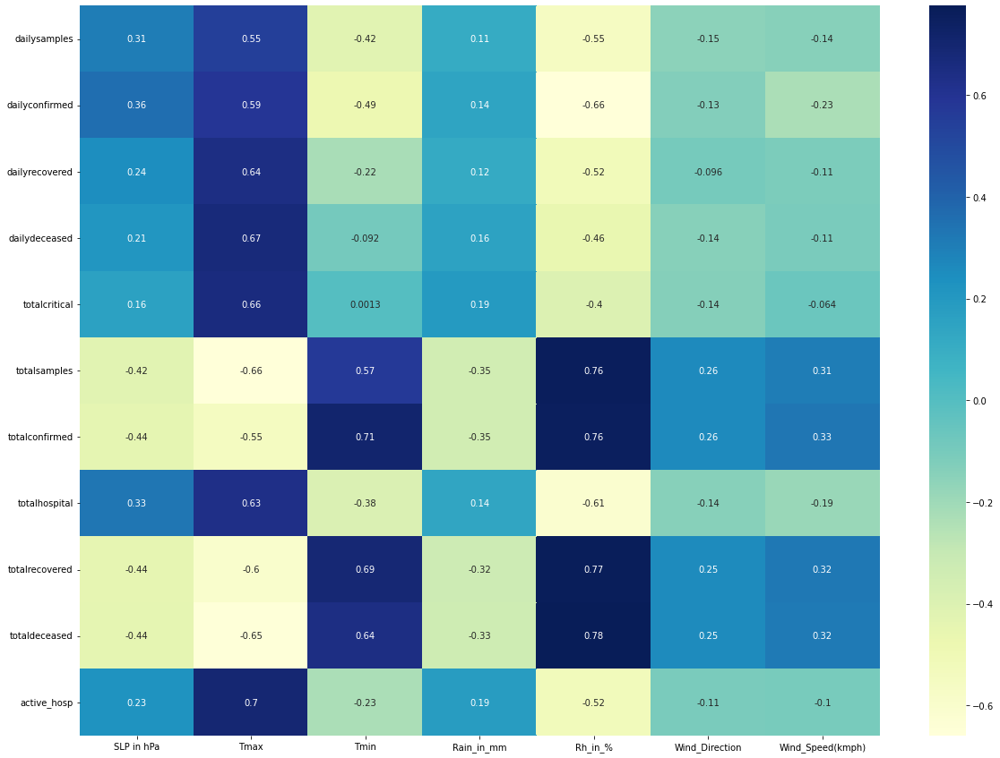

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns 


plt.figure(figsize = (20,15))
sns.heatmap(ddf, cmap="YlGnBu", annot=True)

In [ ]:
cessic_df = ['dailysamples', 'dailyconfirmed', 'dailyrecovered',
       'dailydeceased', 'totalcritical', 'totalsamples', 'totalconfirmed',
       'totalhospital', 'totalrecovered', 'totaldeceased', 'active_hosp']

IMD_df = ['SLP in hPa','Tmax',
       'Tmin', 'Rain_in_mm', 'Rh_in_%', 'Wind_Direction', 'Wind_Speed(kmph)']


/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

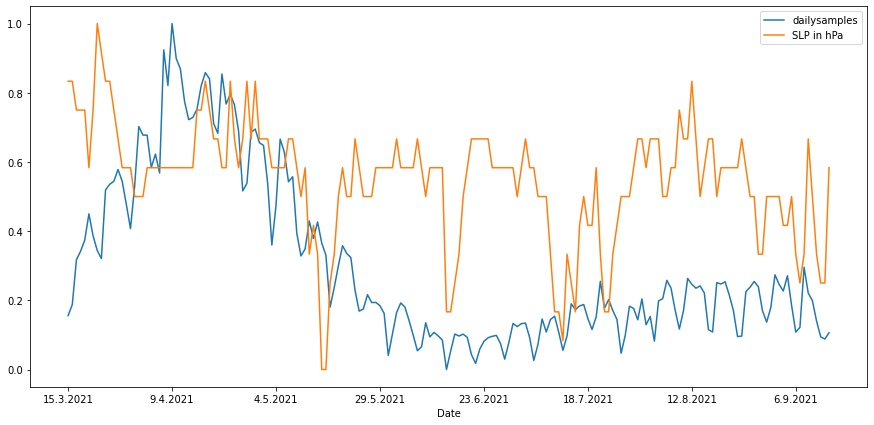

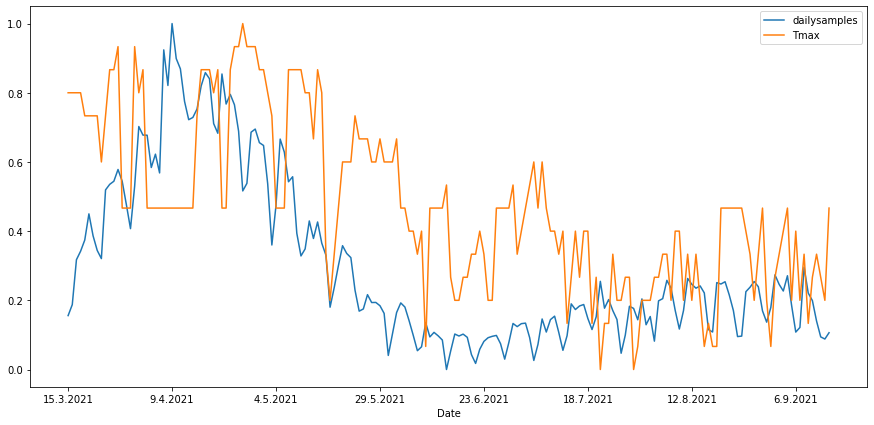

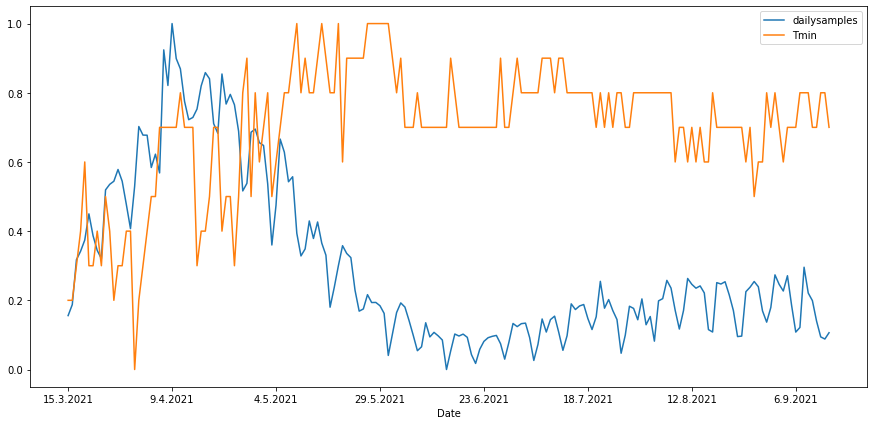

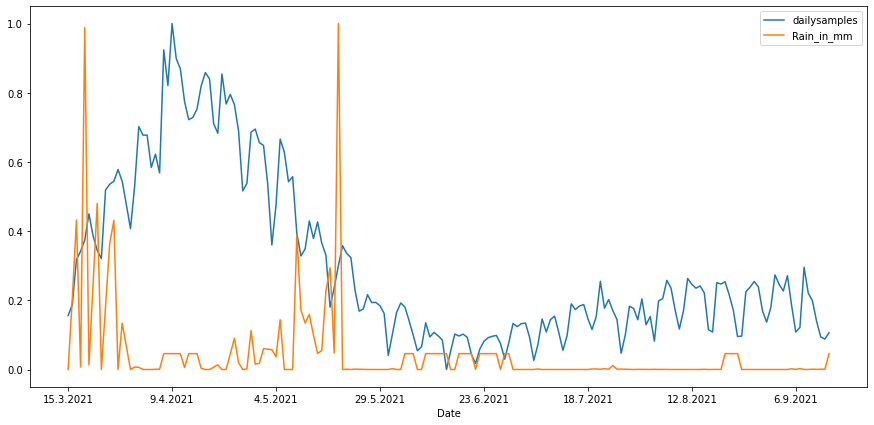

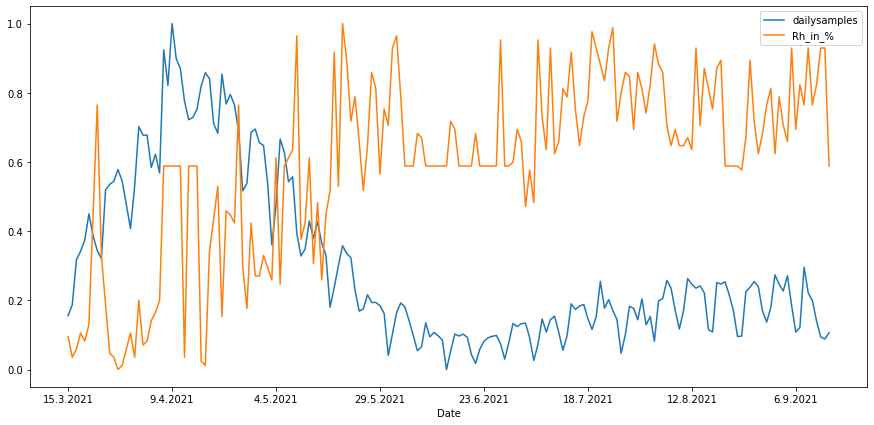

...

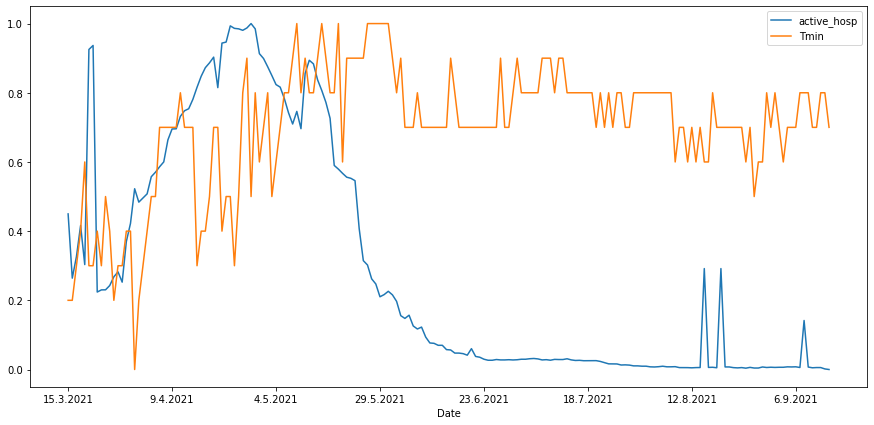

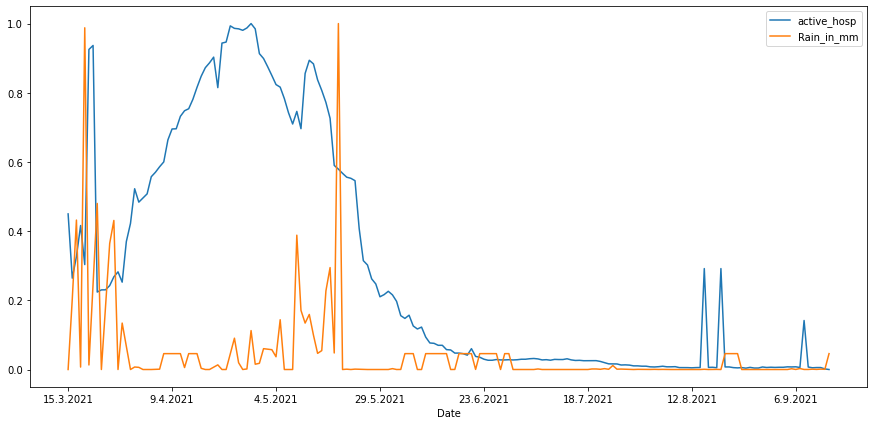

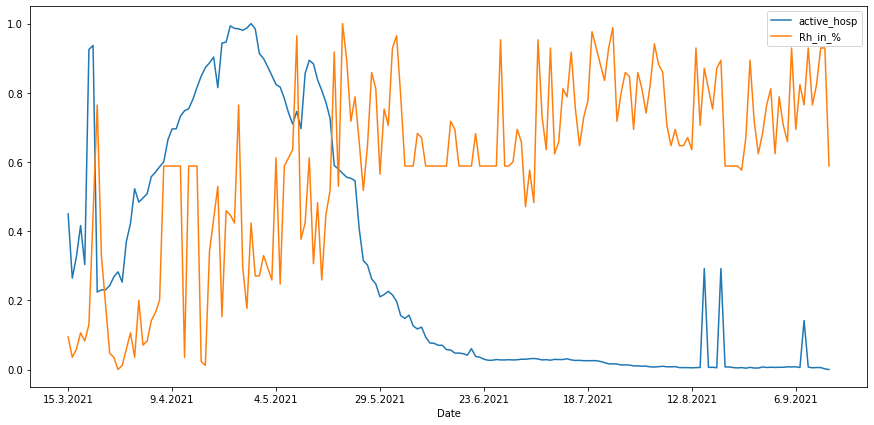

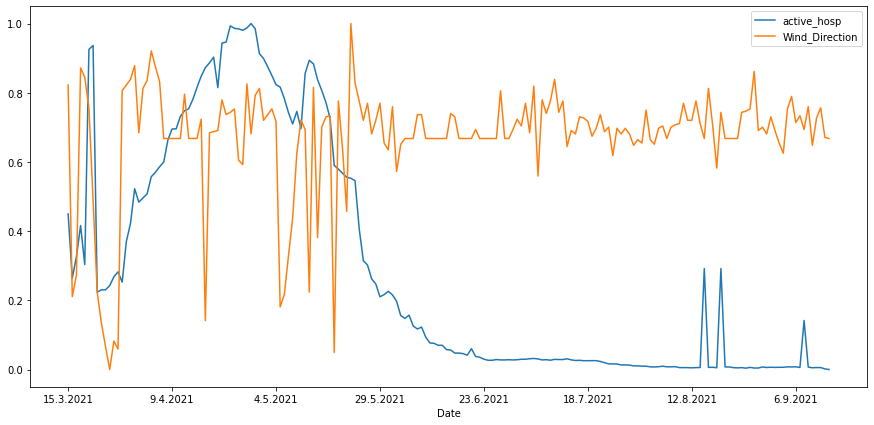

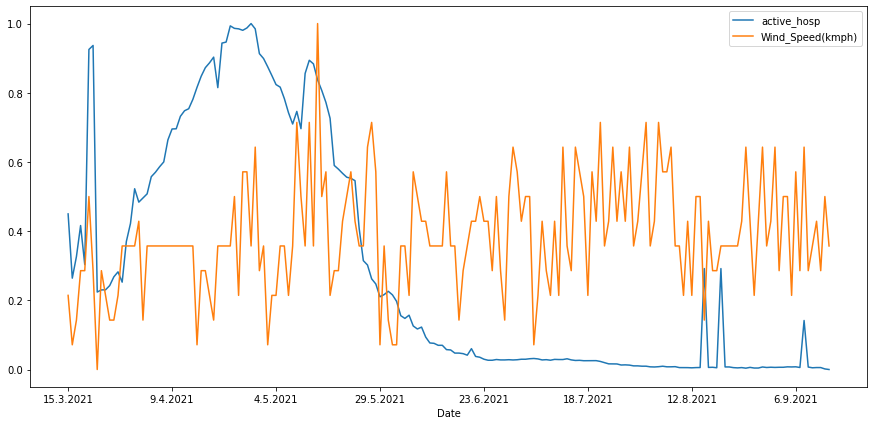

In [ ]:
for c in cessic_df:
  for i in IMD_df:
    df.plot('Date',[c,i],figsize = (15,7))

In [ ]:
'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet',

## only plot the relation with absolute correlation higher than 0.5

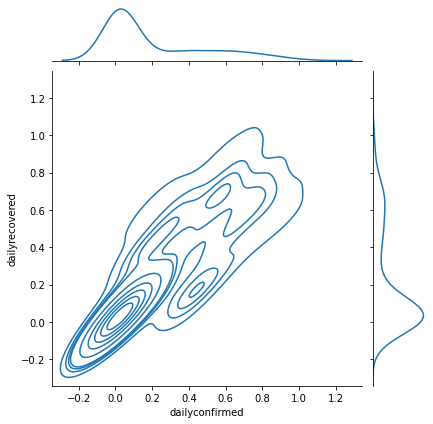

In [ ]:
sns.jointplot(
    x='dailyconfirmed',
    y='dailyrecovered',
    data=df,
    kind='kde'#'scatter' # or 'kde' or 'hex'
)

In [ ]:
plt.figure()
plt.rcParams.update({'font.size': 18}) # must set in top

<Figure size 432x288 with 0 Axes>

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)
/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) a

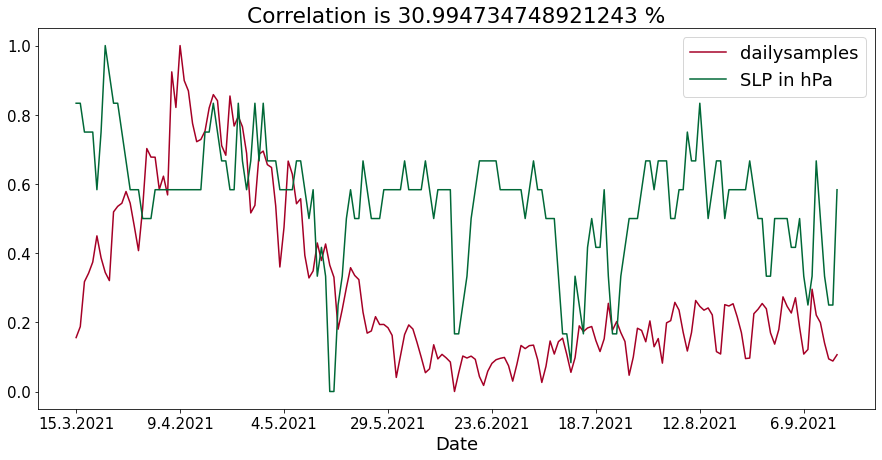

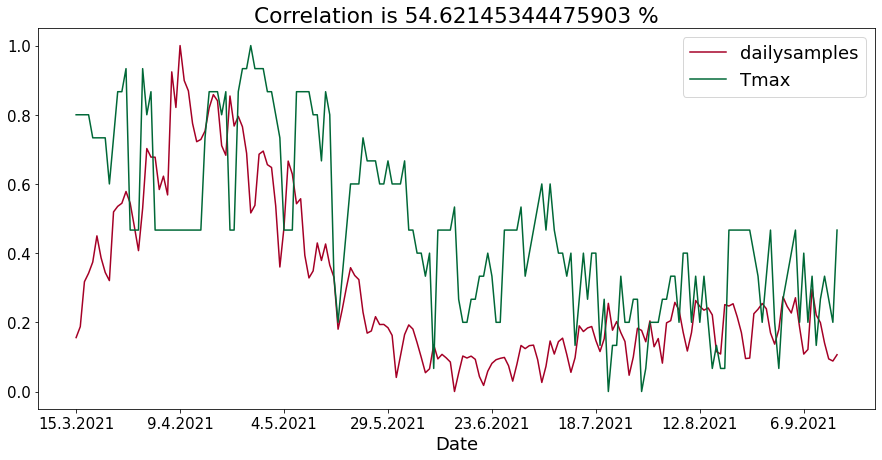

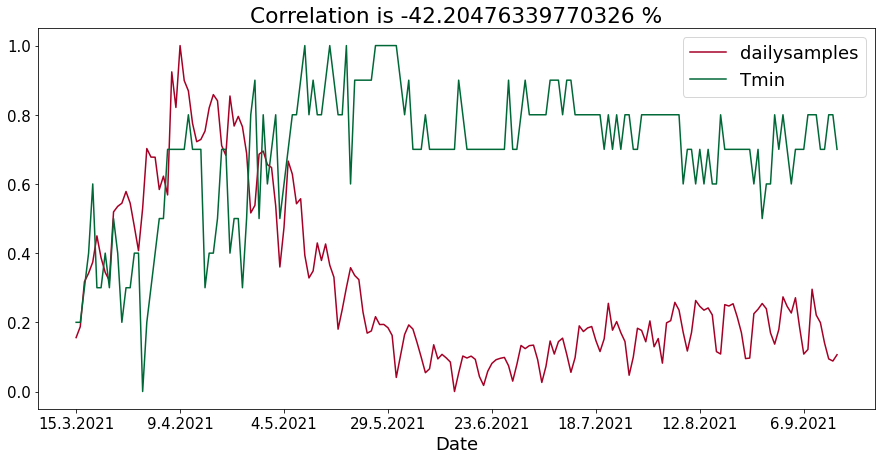

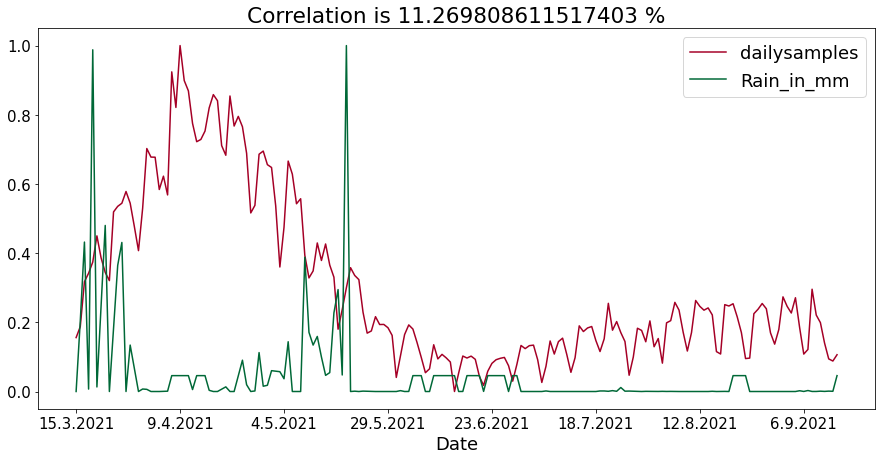

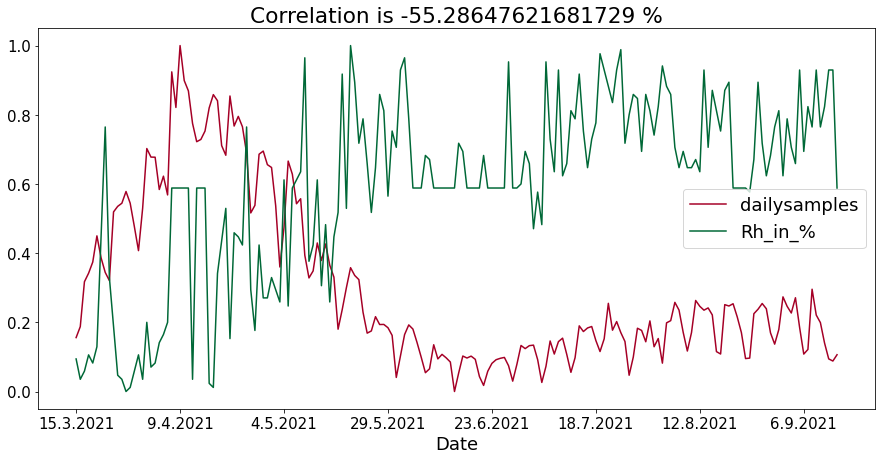

...

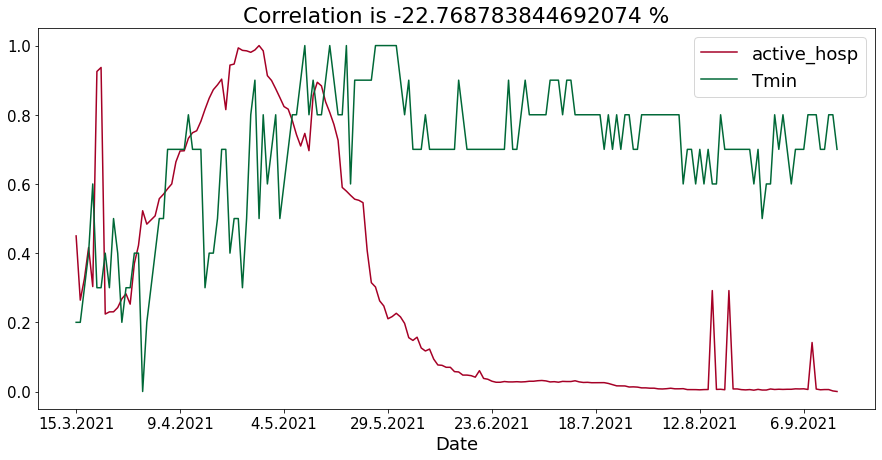

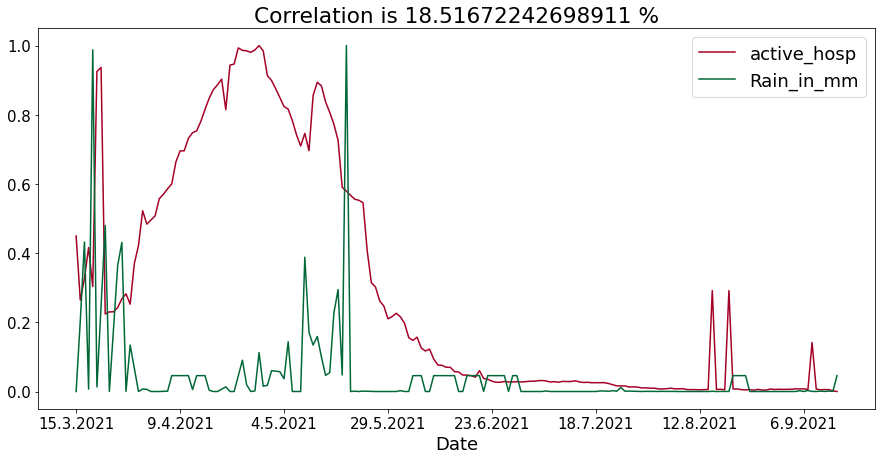

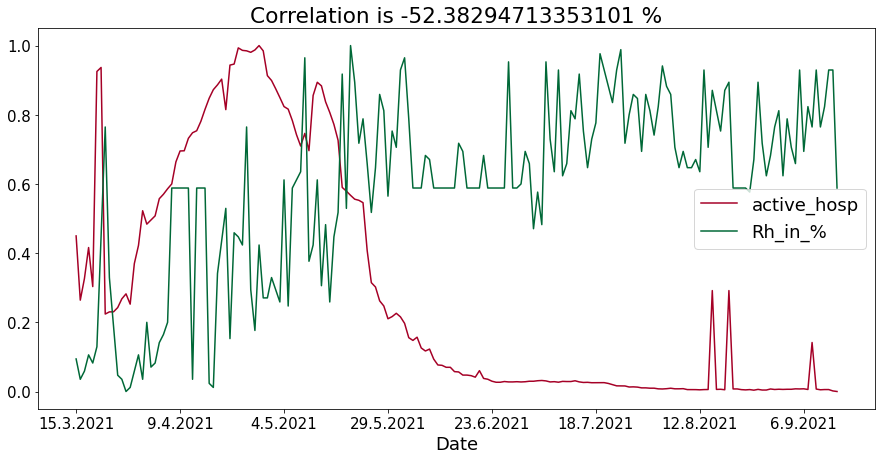

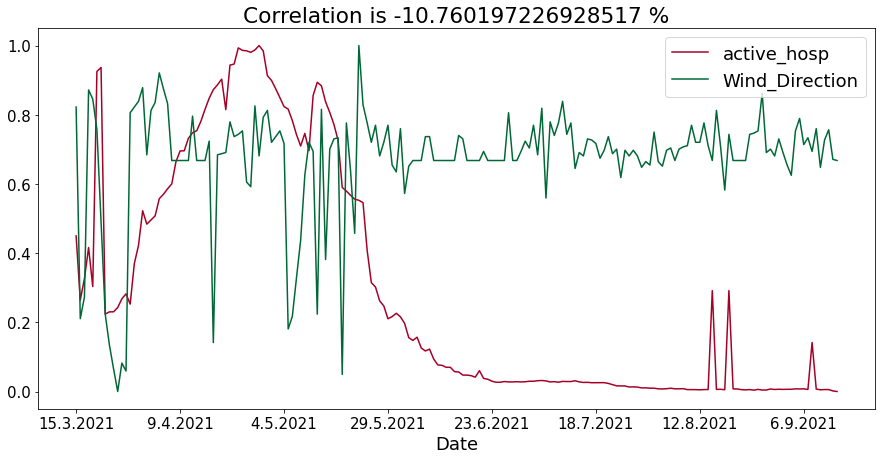

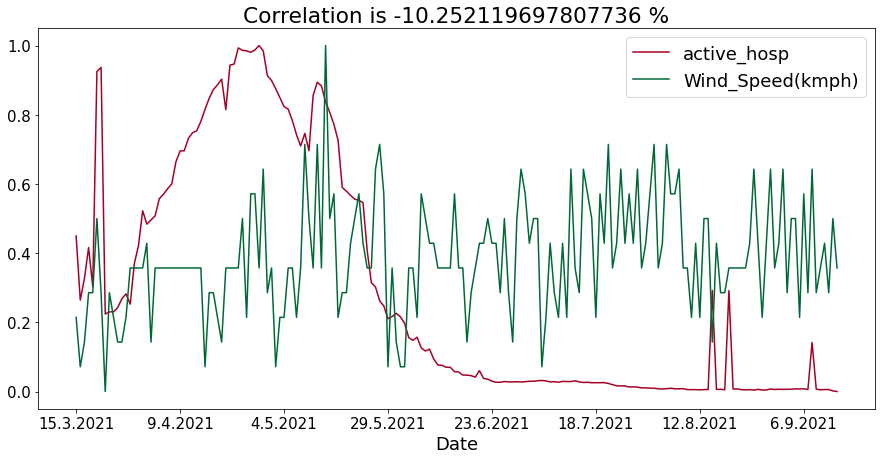

In [ ]:
for c in cessic_df:
    for i in IMD_df:
          
          # y = [(df[c][j],df[i][j]) for j in range(len(df[c]))]# df[c],df[i]]
          # plt.plot(df['Date'], y)
          # plt.xlabel('Date')
          # plt.ylabel('Relative count')
          
          # # displaying the title
          # plt.title(f'Correlation is {ddf[i][c]*100} %',
          #           fontsize = 10)
          
          # plt.figure(figsize = (20,15))

          # plt.show()

          df.plot('Date',[c,i],figsize = (15,7),title = f'Correlation is {ddf[i][c]*100} %',fontsize = 15, colormap ='RdYlGn') #jet